# Introduction

My name is Kfir Levy, and I am deeply passionate about technology and innovation. As a 3D printing enthusiast with three 3D printers at home, I spend much of my time experimenting with complex designs and exploring the capabilities of this transformative technology. Over the years, I have gained extensive hands-on experience in 3D printing, which has given me a deep understanding of both its potential and its challenges. One of the most frustrating issues I encounter is failed prints—problems that result in wasted materials, lost time, and significant troubleshooting efforts. This project is a personal and professional opportunity to address a challenge I know all too well.

3D printing, also known as additive manufacturing, has revolutionized industries by enabling the creation of complex and customized objects with minimal waste. However, the process is not without its challenges, as failures during printing are common and can hinder efficiency and productivity. Detecting such failures early in the process is crucial for improving reliability and reducing costs.

The goal of this project is to train a machine learning model capable of analyzing images of ongoing 3D prints and classifying them as either successful or failed. By leveraging convolutional neural networks (CNNs) and incorporating techniques such as data augmentation and transfer learning, the project seeks to create an automated system that can operate in real-world conditions. This solution has the potential to significantly improve the reliability of 3D printing and support its adoption across diverse fields, including manufacturing, healthcare, and aerospace.

This project combines my passion for 3D printing with cutting-edge machine learning methodologies. By tackling the technical challenges of noisy and unbalanced datasets, I aim to build a robust and accurate model that will make 3D printing more efficient and accessible for enthusiasts and professionals alike. Through this work, I hope to contribute to advancing the capabilities of 3D printing technology.

# Introduction to 3D Printing and FDM Technology

3D printing, also known as additive manufacturing, creates three-dimensional objects by adding material layer by layer, based on a digital design. Among the various technologies used in 3D printing, Fused Deposition Modeling (FDM) is one of the most widely adopted methods due to its affordability and accessibility. FDM is commonly used by hobbyists, small businesses, and even large-scale manufacturers for prototyping and production.

<u>In the FDM process:</u>

    1. Filament: A spool of thermoplastic material (such as PLA, ABS, or PETG) is used as the raw material.
    2. Extruder: The filament is heated and melted in an extruder component, which pushes the melted material through a nozzle.
    3. Build Platform (Print Bed): The nozzle deposits the molten filament layer by layer onto a flat surface, called the print bed, which can be heated to improve adhesion.
    4. G-code: A digital file containing instructions (coordinates, speeds, and temperatures) guides the printer to move the nozzle and deposit the material in the desired pattern.
    5. Cooling: As each layer cools and solidifies, the next layer is added on top, forming a 3D object.

<u>Key Terms:</u>

    Layer Height: The thickness of each individual layer in the print, affects both resolution and print time.
    Infill: The internal structure of a print, which can vary in density (e.g., 20% infill for lightweight objects or 100% for solid structures).
    Supports: Temporary structures added during printing to hold overhanging parts of the model, which are removed after the print is completed.
    Extrusion: The process of pushing filament through the nozzle to create the printed layers.

Despite its accessibility, FDM printing comes with its own set of challenges, as even minor errors in calibration, filament quality, or environmental conditions can lead to print failures.


<center>
<img src="https://i.imgur.com/kzOso0o.png" width="600">
</center>


# The Problem

3D printing, especially using FDM, is a transformative technology, but it is not without challenges. Among the most common issues faced during FDM 3D printing are:

    1. Layer Shifting: Caused by sudden movements or mechanical issues, resulting in misaligned layers.
    2. Clogged Nozzles: Leads to uneven extrusion or complete failure of the print.
    3. Warping: Occurs when prints cool unevenly, causing edges to lift off the print bed.
    4. Poor Bed Adhesion: Causes the first layer to detach, leading to an incomplete print.
    5. Stringing and Blobs: Resulting from improper retraction settings, leaving strands of filament between parts of the model.

While these issues are common, one of the most frustrating and destructive problems is known as "spaghetti" failures. This occurs when the filament continues to extrude without adhering to the model, creating a tangled mess of filament that resembles spaghetti. This problem can lead to extensive material waste, printer damage, and lost time, especially if left undetected for hours during long print jobs.

Due to the prevalence and visual distinctiveness of spaghetti failures, as well as the lack of publicly available datasets for other types of failures, this project focuses specifically on detecting spaghetti failures. By addressing this specific issue, I aim to provide a proof of concept for failure detection that can potentially be expanded to include other failure types in the future.


<center>
    <video src="https://i.imgur.com/9y8Rvzc.mp4" width="800" height="500" controls>
</center>

# Challenges in Gathering Data

One of the primary challenges in this project was the lack of publicly available datasets containing images of 3D printing failures. While 3D printing is a popular technology, specific datasets focusing on failures—especially spaghetti failures—are scarce. This limitation presented a significant hurdle, as machine learning models require diverse and extensive datasets for effective training and evaluation.

After extensive searching, I was able to obtain several datasets from Roboflow (some after augmentin), containing approximately 1500 photos.

The dataset was formatted for the YOLO v11 architecture, a widely used object detection format that includes labeled bounding boxes for detecting specific objects or regions in images. While this dataset provided a starting point, I recognized the need to expand it to improve the model’s ability to generalize across various scenarios and setups.


# Custom Data Collection Setup

To complement the Roboflow dataset and address its limitations, I created a custom data collection setup. This setup utilized two different 3D printers, each equipped with one to two cameras mounted at different positions. The main considerations in designing this setup were:

<u>Camera Placement:</u>

Cameras were positioned at different angles to capture diverse perspectives of the printing process.
This approach ensures that the model does not overfit to a specific camera angle, improving its ability to detect spaghetti failures from varied viewpoints in real-world scenarios.

<u>Variety in Filament Colors:</u>

Prints were conducted using filaments of different colors, ensuring the model is not biased toward detecting failures based on specific color patterns.
    
<u>Diverse Printing Scenarios:</u>

Printing failures were intentionally caused by altering variables such as bed leveling, filament flow, and nozzle temperature. Successful prints were also recorded to maintain a balanced dataset.
    
Through this setup, I collected several hundred additional images, effectively expanding the dataset and diversifying the conditions under which the failures were captured.


<center>
    <img src="https://i.imgur.com/qXSn8of.png" width="800" height="500"/>
    <img src="https://i.imgur.com/ipI1Xz2.png" width="800" height="150"/>
</center>

The collected data underwent preprocessing and segmentation to ensure consistency and compatibility with the YOLO v11 format.

<u>Segmentation:</u>

Each image was manually annotated to mark regions where spaghetti failures occurred.
Bounding boxes were created to highlight the failed areas of the prints.

<u>Conversion to YOLO Format:</u>

The annotations and images were converted to the YOLO v11 format, enabling seamless integration with the pre-existing dataset from Roboflow.
This included normalizing bounding box coordinates and creating label files for each image.

<u>Dataset Composition:</u>

Combined the Roboflow dataset with the newly collected images to create a comprehensive dataset of over 3,000 images.
Ensured a balanced distribution of successful and failed prints to prevent class imbalance.

# Initial EDA

In [145]:
import os
import cv2
import torch
import shutil
import random
from math import *
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
from pathlib import Path
import albumentations as A
from ultralytics import YOLO
from torchvision import transforms
from torch.utils.data import Dataset
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from sklearn.model_selection import train_test_split

train_str, valid_str, test_str = "train", "valid", "test"
images_str, labels_str = "images", "labels"
jpg_suffix, png_suffix, txt_suffix = ".jpg", ".png", ".txt"
failure = "Spaghetti"
success = "Success"
class_id_to_str = {0: failure, 1: success}

The dataset used in this project consists of two primary sources: images collected from the internet and a custom dataset I created using my own 3D printing setup. This unique combination provides an opportunity to explore the characteristics of both externally sourced and self-generated data. Through exploratory data analysis, my goal is to investigate the structure, balance, and overall quality of the dataset, gaining valuable insights into its composition. By analyzing the data, I aim to identify trends, patterns, and potential issues that could influence the model's performance and improve my understanding of the dataset before moving forward with training.

## Dataset Structure

At this early stage of EDA, the dataset is in its raw form, organized into a single directory structure with separate folders for images and labels. This step focuses on gaining an initial understanding of the data by verifying its structure, identifying potential issues such as missing labels, and summarizing basic statistics. Performing this type of analysis is crucial to ensure that the dataset is complete, properly organized, and suitable for subsequent preprocessing and training.

'images' folder contains JPEG/PNG images of the 3D prints, while the 'labels' folder contains YOLOv11-compatible annotations where each image has a corresponding label file. These label files contain bounding box information in the following format:


Where:

    - class_id: 0 for spaghetti failures, 1 for successful prints.
    - x_center, y_center: Normalized center coordinates of the bounding box.
    - width, height: Normalized dimensions of the bounding box.

## Visualizing Annotations

In [11]:
mini_dataset_path = Path("Final/MiniDataset/dataset")
initial_dataset_path = Path("Final/InitDataset/dataset")
final_dataset_path = Path("Final/dataset")

To verify the quality of the annotations, I visualized the bounding boxes overlaid on the corresponding images. This step helped ensure the accuracy of the labels and identify any misaligned or erroneous annotations.


Below are sample images from the dataset showing successful prints and spaghetti failures:

In [14]:
def parse_yolo_annotation(label_path, img_width, img_height):
    annotations = []
    with open(label_path, 'r') as file:
        for line in file:
            class_id, x_center, y_center, width, height = map(float, line.strip().split())
            x_min = int((x_center - width / 2) * img_width)
            y_min = int((y_center - height / 2) * img_height)
            x_max = int((x_center + width / 2) * img_width)
            y_max = int((y_center + height / 2) * img_height)
            annotations.append((class_id, x_min, y_min, x_max, y_max))
    return annotations

In [123]:
def plot_image_with_boxes(img_path, label_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_height, img_width = img.shape[:2]

    annotations = parse_yolo_annotation(label_path, img_width, img_height)

    for class_id, x_min, y_min, x_max, y_max in annotations:
        color = (255, 0, 0) if int(class_id) == 0 else (0, 255, 0)
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color, 2)
        cv2.putText(img, class_id_to_str[int(class_id)], (x_min, y_min - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    
    return img

def display_dataset_images(dataset_path, plot_size):
    images_dir = os.path.join(dataset_path, images_str)
    labels_dir = os.path.join(dataset_path, labels_str)
    image_files = sorted(os.listdir(images_dir))
    label_files = sorted(os.listdir(labels_dir))

    row_size, col_size = plot_size
    fig, axes = plt.subplots(row_size, col_size, figsize=(25, 25), facecolor="white")
    
    row_index, col_index = 0, 0

    for img_file, lbl_file in zip(image_files, label_files):
        # if img_file.startswith("."):
        #     continue
        img_path = os.path.join(images_dir, img_file)
        label_path = os.path.join(labels_dir, lbl_file)

        img = plot_image_with_boxes(img_path, label_path)
        axes[row_index][col_index].imshow(img)
        axes[row_index][col_index].axis("off")

        row_index += 1
        if row_index % row_size == 0:
            col_index += 1
            row_index = 0

    plt.tight_layout(rect=[0, 0, 1, 0.85])
    plt.show()


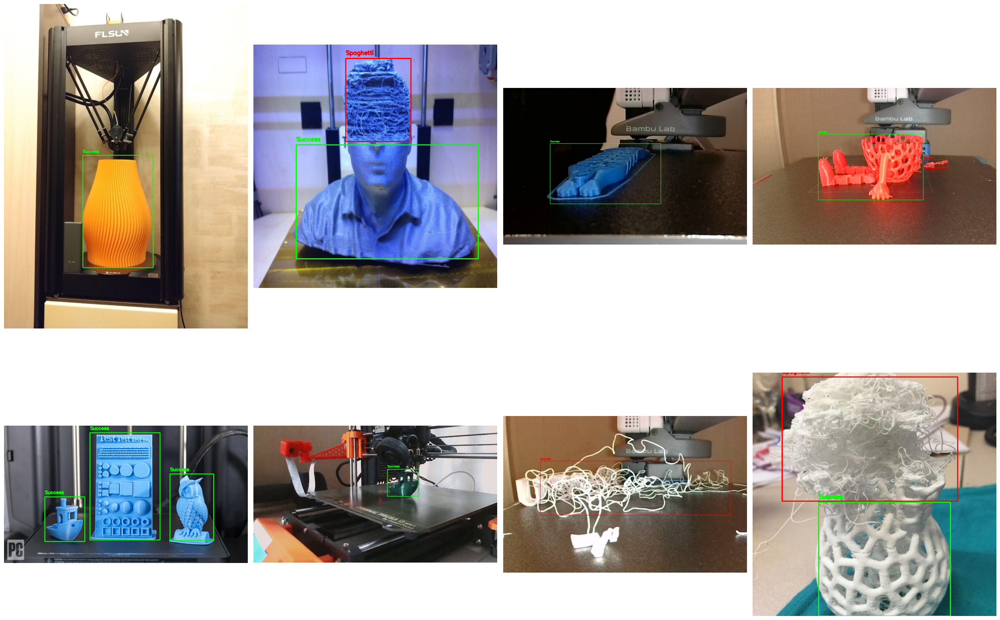

In [131]:
mini_dataset_size = len(os.listdir(os.path.join(mini_dataset_path, images_str)))
display_dataset_images(mini_dataset_path, (mini_dataset_size // 4, mini_dataset_size // 2))

## Verifying Dataset Integrity

Before diving into training or further preprocessing, it's essential to validate the integrity of the dataset. This includes ensuring that each image file has a corresponding label file, verifying that there are no missing or mismatched annotations, and summarizing the dataset to identify potential issues such as class imbalances or incomplete data. By performing these checks early, we can address any issues and ensure the dataset is robust and ready for the next stages of development.

In [22]:
def add_labels(bars, ax):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height}',  xy=(bar.get_x() + bar.get_width() / 2, height),
            xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')
    
def plot_category_comparison(category_names, category_1_counts, category_2_counts,
                             category_1_label, category_2_label, x_label, y_label, title):
    x_positions = np.arange(len(category_names))
    bar_width = 0.15

    fig, ax = plt.subplots(figsize=(10, 6))
    category_1_bar = ax.bar(x_positions - bar_width / 2, category_1_counts, bar_width, label=category_1_label)
    category_2_bar = ax.bar(x_positions + bar_width / 2, category_2_counts, bar_width, label=category_2_label)

    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(title)
    ax.set_xticks(x_positions)
    ax.set_xticklabels(category_names)
    ax.legend()

    add_labels(category_1_bar, ax)
    add_labels(category_2_bar, ax)
    plt.tight_layout()
    plt.show()
    
def validate_datasets_labels_vs_images(dataset_directories, plot=True):
    dataset_names = []
    images_counts = []
    labels_counts = []

    for dataset_name, paths in dataset_directories.items():
        image_files = set(os.listdir(paths[images_str]))
        label_files = set(os.listdir(paths[labels_str]))
        num_images = len(image_files)
        num_labels = len(label_files)
        dataset_names.append(dataset_name.capitalize())
        images_counts.append(num_images)
        labels_counts.append(num_labels)

        print(f"\n{dataset_name.capitalize()} Dataset:")
        print(f"Total Images: {num_images}")
        print(f"Total Labels: {num_labels}")

        missing_labels = [
            img for img in image_files
            if img.replace(png_suffix, txt_suffix).replace(jpg_suffix, txt_suffix) not in label_files
        ]

        if not missing_labels:
            print("✅ All images have corresponding label files.")
        else:
            print(f"❌ Missing {len(missing_labels)} label file(s).")
            print(f"Missing Labels: {', '.join(missing_labels)}")
    if plot:
        plot_category_comparison(dataset_names, images_counts, labels_counts, images_str, labels_str, 'Dataset',
                                'Count', 'Image and Label Counts per Dataset')

In [24]:
image_dir = os.path.join(initial_dataset_path, images_str)
label_dir = os.path.join(initial_dataset_path, labels_str)

dataset_dirs = {"raw_data": {images_str: image_dir, labels_str: label_dir},}

validate_datasets_labels_vs_images(dataset_dirs, plot=False)


Raw_data Dataset:
Total Images: 3634
Total Labels: 3634
✅ All images have corresponding label files.


## Class Distribution Analysis

Class balance is critical to avoid bias in the model. To analyze the distribution of successful and failed prints in the dataset, I counted the occurrences of each class_id (0 for success, 1 for failure) in the label files:

In [28]:
def contains_spaghetti(label_path):
    with open(label_path, 'r') as f:
        for annotation in f:
            class_id = int(annotation.split()[0])
            if class_id == 0:
                return True
    return False

def count_classes(label_dir):
    class_counts = {success: 0, failure: 0}
    for label_file in os.listdir(label_dir):
        label_path = os.path.join(label_dir, label_file)
        if contains_spaghetti(label_path):
            class_counts[failure] += 1
        else:
            class_counts[success] += 1
    return class_counts

def check_imbalance(success_amount, failure_amount, imbalance_allowed):
    total = success_amount + failure_amount
    imbalnce_allowed_actual = ((imbalance_allowed * total) / 100)
    imbalance = abs(success_amount - failure_amount)
    imbalance_percentage = (imbalance * 100) / total
    if imbalance <= imbalnce_allowed_actual:
        print(f"✅ {success} and {failure} are balanced.")
    else:
        print(f"❌ {success} and {failure} are not balanced.")
    print(f"Imbalance: {imbalance} ({imbalance_percentage:.2f}%)")

def analyze_class_distribution(dataset_dirs, plot=True):
    imbalance_allowed = 25
    failure_counts = []
    success_counts = []
    for name, dirs in dataset_dirs.items():
        print(f"\n{name.capitalize()} Class Distribution:")
        class_counts = count_classes(dirs[labels_str])
        success_amount = class_counts[success]
        failure_amount = class_counts[failure]
        failure_counts.append(failure_amount)
        success_counts.append(success_amount)
        print(f"{success}: {success_amount}")
        print(f"{failure}: {failure_amount}")
        check_imbalance(success_amount, failure_amount, imbalance_allowed)
    if plot:
        plot_category_comparison(dataset_dirs, success_counts, failure_counts, success, failure, 'Dataset',
                        'Count', 'Success and Failure Counts per Dataset')

In [30]:
analyze_class_distribution(dataset_dirs, plot=False)


Raw_data Class Distribution:
Success: 2280
Spaghetti: 1354
❌ Success and Spaghetti are not balanced.
Imbalance: 926 (25.48%)


The analysis of class distribution revealed a notable imbalance in the dataset, with a higher number of successful prints compared to spaghetti failures. This imbalance could introduce bias in the model, potentially leading it to favor the majority class and reducing its effectiveness in detecting failures. Addressing this issue is essential to ensure the model learns to accurately recognize both successful and failed prints.

To mitigate this imbalance, I plan to apply fewer augmentations to images of successful prints while maintaining a higher augmentation rate for spaghetti failure images. This approach will artificially balance the dataset without over-representing any single category. By strategically adjusting the augmentation process, I can ensure that the model is exposed to a more diverse and representative set of failure cases, ultimately improving its ability to detect and classify printing issues accurately.


## Image Dimension Analysis

Consistent image dimensions are important for training YOLO models. I analyzed the dimensions of the images in the dataset to ensure they met YOLO input requirements.

In [35]:
def analyze_image_dimensions(image_dir):
    dimensions = []
    for img_file in os.listdir(image_dir):
        img_path = os.path.join(image_dir, img_file)
        with Image.open(img_path) as img:
            dimensions.append(img.size)
    return dimensions

def count_dimensions(dimensions):
    dimension_counts = {}
    for dim in dimensions:
        if dim in dimension_counts:
            dimension_counts[dim] += 1
        else:
            dimension_counts[dim] = 1
    return dimension_counts

def display_dimension_histogram(subset_dimensions):
    num_subsets = len(subset_dimensions)
    fig, axes = plt.subplots(1, num_subsets, figsize=(10 * num_subsets, 6), squeeze=False)
    
    for i, (dataset_name, dimensions) in enumerate(subset_dimensions.items()):
        widths, heights = zip(*dimensions)
        ax = axes[0, i]
        
        ax.hist([widths, heights], bins=15, label=["Widths", "Heights"], alpha=0.7, edgecolor="black")
        ax.set_title(f"Dimension Distribution: {dataset_name.capitalize()}", fontsize=16)
        ax.set_xlabel("Pixels", fontsize=14)
        ax.set_ylabel("Frequency", fontsize=14)
        ax.legend()
    
    plt.tight_layout()
    plt.show()

def analyze_and_display_image_dimensions(dataset_dirs):
    subset_dimensions = {}
    for name, dirs in dataset_dirs.items():
        print(f"\nAnalyzing dimensions for {name.capitalize()} dataset...")
        dimensions = analyze_image_dimensions(dirs[images_str])
        subset_dimensions[name] = dimensions

    display_dimension_histogram(subset_dimensions)



Analyzing dimensions for Raw_data dataset...


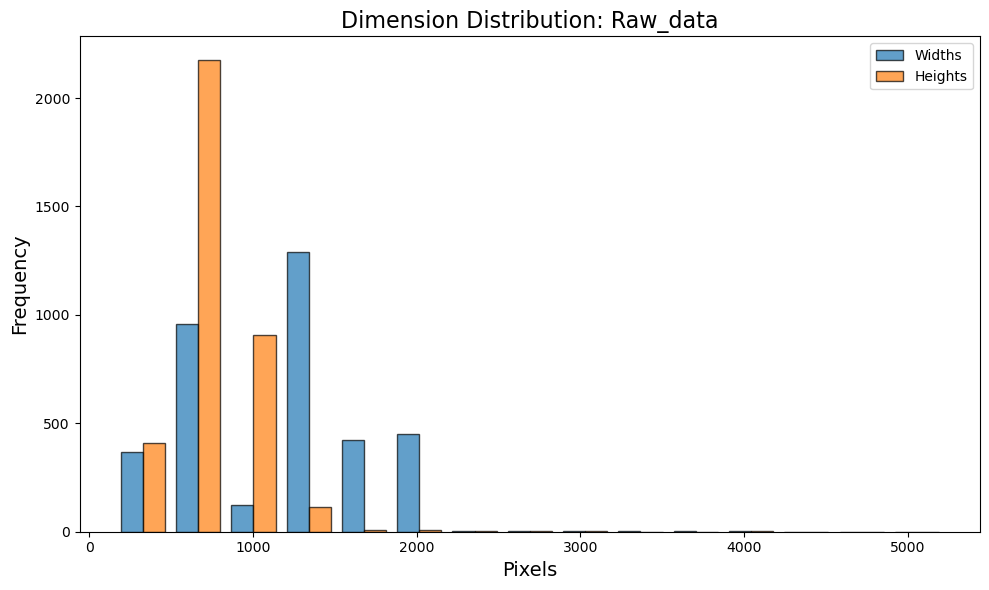

In [37]:
analyze_and_display_image_dimensions(dataset_dirs)

The histogram reveals significant variation in image dimensions within the intial dataset, with certain resolutions appearing more frequently while others are outliers. This inconsistency can pose challenges for model training, as deep learning models typically require standardized input sizes. The presence of dominant dimension ranges suggests that some resolutions are more common, but the spread indicates a lack of uniformity. To ensure consistency and improve model performance, a preprocessing step to resize all images to a fixed resolution (640x640) is necessary. This will help the model generalize better and avoid potential training inefficiencies caused by varying input sizes.

## Balance Between Custom and Internet Data Analysis

Analyzing the balance between custom data (images starts with "kfirs_setup_") and internet-sourced data is critical for ensuring the dataset's reliability and representativeness. A well-balanced dataset helps prevent model bias toward one source of data, which could result in poor generalization and suboptimal performance in real-world scenarios. By comparing the proportions of custom and internet labels, we can verify that the model is exposed to diverse data distributions and printing conditions. This step is especially important when custom data introduces unique characteristics that might not be present in publicly available datasets, ensuring that both data sources contribute equally to the learning process and enhancing the robustness of the model.

In [42]:
kfir_setup_prefix="kfirs_setup_"

def count_kfir_setup_labels(label_dir):
    kfir_count = 0
    other_count = 0
    
    for label_file in os.listdir(label_dir):
        if kfir_setup_prefix in label_file:
            kfir_count += 1
        else:
            other_count += 1
            
    return kfir_count, other_count

def compare_kfir_to_internet_data(dataset_dirs):
    imbalance_allowed = 25
    dataset_names = []
    kfir_counts = []
    other_counts = []

    for name, dirs in dataset_dirs.items():
        print(f"\nAnalyzing {name.capitalize()} Dataset:")
        label_dir = dirs["labels"] 
        kfir_count, other_count = count_kfir_setup_labels(label_dir)
        dataset_names.append(name.capitalize())
        kfir_counts.append(kfir_count)
        other_counts.append(other_count)
        total = kfir_count + other_count
        kfir_ratio = (kfir_count / total) * 100 if total > 0 else 0
        other_ratio = (other_count / total) * 100 if total > 0 else 0
                
        print(f"Total Labels: {total}")
        print(f"{kfir_setup_prefix} Labels: {kfir_count} ({kfir_ratio:.2f}%)")
        print(f"Other Labels: {other_count} ({other_ratio:.2f}%)")
        check_imbalance(kfir_count, other_count, imbalance_allowed)

    plot_category_comparison(dataset_dirs, kfir_counts, other_counts, "Kfir Setup", "Internet", 'Dataset',
                    'Count', "Kfir's Setup and Internet Counts per Dataset")


Analyzing Raw_data Dataset:
Total Labels: 3634
kfirs_setup_ Labels: 2055 (56.55%)
Other Labels: 1579 (43.45%)
✅ Success and Spaghetti are balanced.
Imbalance: 476 (13.10%)


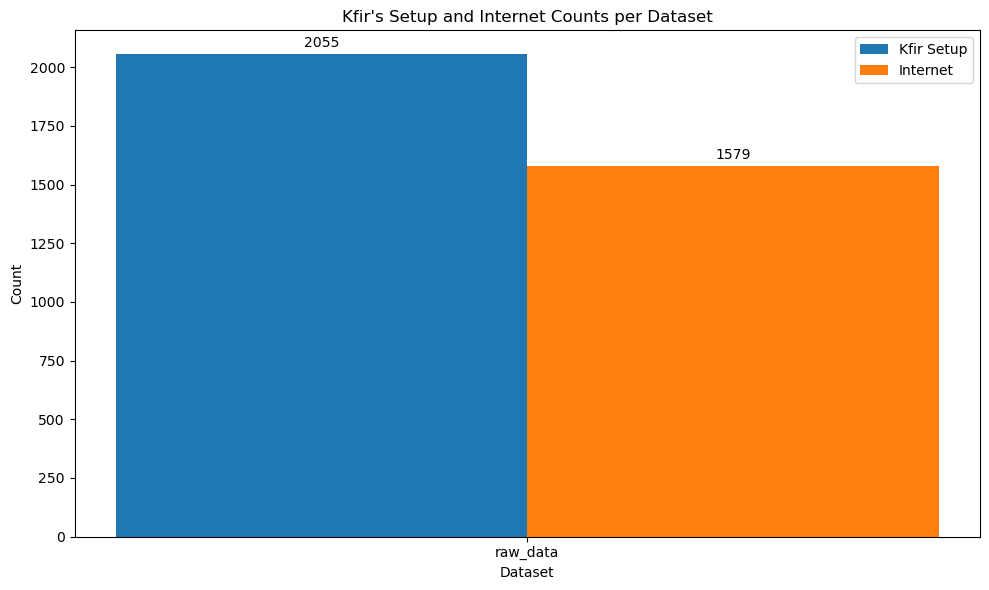

In [44]:
compare_kfir_to_internet_data(dataset_dirs)

The analysis of the dataset's origin reveals that 56.55% of the images originate from the custom "kfirs_setup_" dataset, while 43.45% come from external sources. This indicates a slight dominance of self-generated data, but the difference is not extreme. The presence of both data sources ensures diversity, which is crucial for improving the model’s generalization ability. If necessary, further adjustments can be made to balance the dataset by either incorporating more external images or limiting augmentations on the custom dataset.

## Summary of Initial EDA

The intial EDA provided a comprehensive understanding of the dataset's structure, balance, and potential preprocessing needs. The dataset was confirmed to be well-organized, with all images having corresponding label files, ensuring completeness and consistency. However, an imbalance was observed between successful and failed prints, with successful prints being significantly more prevalent. To mitigate this, the augmentation strategy will be adjusted to generate fewer augmented images for successful prints, ensuring a more balanced dataset.

Additionally, the image dimensions varied significantly, highlighting the need for preprocessing steps such as resizing to standardize the dataset for model training. The analysis of data sources revealed a healthy mix of custom and internet-sourced images, with a slight dominance of custom data. This diversity is beneficial for model generalization but may require further balancing if biases emerge during training. These insights provide a solid foundation for the next phase of preprocessing, augmentation, and data structuring, ensuring the dataset is well-prepared for training.




# Dataset Preprocessing

## Data Augmentation

To increase the diversity of the dataset and improve model generalization, I applied the following augmentation techniques:

<u>Rotation:</u>
Rotating images by up to 90 degrees to simulate different orientations of objects and increase robustness to positional variance.

<u>Brightness Adjustments:</u>
Adjusting the brightness of images to simulate varying lighting conditions, ensuring the model can handle diverse illumination scenarios.

<u>Hue and Saturation Shifts:</u>
Altering hue, saturation, and value to simulate different color environments and improve color invariance.
 
<u>Blurring:</u>
Applying blur to images to mimic scenarios where objects might not be in perfect focus.


<u>Scaling:</u>
Scaling images up or down to simulate different object sizes and distances from the camera.

<u>Inversion:</u>
Using empty transformations to test edge cases and provide a baseline for augmentation analysis.
    
Each augmentation method is configured with bounding box adjustments to maintain accurate annotations in the YOLO format, ensuring compatibility with object detection models.


In [54]:
bbox_params = A.BboxParams(format="yolo", label_fields=["category_ids"])
augmentation_pipelines = {
    "flipped": A.Compose(
        [A.Rotate(limit=90, p=1)],
        bbox_params=bbox_params
    ),
    "darkened": A.Compose(
        [A.RandomBrightnessContrast(brightness_limit=(-0.25, -0.15), contrast_limit=0.5, p=1)],
        bbox_params=bbox_params
    ),
    "lightened": A.Compose(
        [A.RandomBrightnessContrast(brightness_limit=(0.4, 0.5), contrast_limit=0.5, p=1)],
        bbox_params=bbox_params
    ),
    "inverted": A.Compose(
        [],
        bbox_params=bbox_params
    ),
    "jittered": A.Compose(
        [A.HueSaturationValue(hue_shift_limit=60, sat_shift_limit=50, val_shift_limit=50, p=1)],
        bbox_params=bbox_params
    ),
    "blurred": A.Compose(
        [A.Blur(blur_limit=9, p=1)],
        bbox_params=bbox_params
    ),
    "zoomed": A.Compose(
        [A.Affine(scale=(1.6, 1.6), p=1)],
        bbox_params=bbox_params
    ),
}

In [76]:
def parse_labels(label_path):
    bboxes, category_ids = [], []
    try:
        with open(label_path, "r") as f:
            for label in f.readlines():
                parts = label.strip().split()
                if len(parts) == 5:
                    bboxes.append(list(map(float, parts[1:])))
                    category_ids.append(int(parts[0]))
    except Exception as e:
        print(f"Error parsing {label_path}: {e}")
    return bboxes, category_ids

def normalize_bboxes(bboxes, img_width, img_height):
    normalized_bboxes = []
    for bbox in bboxes:
        x_center, y_center, width, height = bbox
        x_center, y_center, width, height = float(x_center), float(y_center), float(width), float(height)
        x_center = min(x_center, 1)
        y_center = min(y_center, 1)
        width = min(width, 1)
        height = min(height, 1)
        normalized_bboxes.append([f"{x_center:.10f}", f"{y_center:.10f}", f"{width:.10f}", f"{height:.10f}"])
    return normalized_bboxes

def save_labels_and_image(output_image_dir, output_label_dir, img_file, suffix, image, bboxes, category_ids):
    img_name, label_name = f"{os.path.splitext(img_file)[0]}{suffix}{png_suffix}", f"{os.path.splitext(img_file)[0]}{suffix}{txt_suffix}"
    cv2.imwrite(os.path.join(output_image_dir, img_name), image)
    os.makedirs(output_label_dir, exist_ok=True)
    img_height, img_width = image.shape[:2]
    normalized_bboxes = normalize_bboxes(bboxes, img_width, img_height)

    with open(os.path.join(output_label_dir, label_name), "w") as f:
        for bbox, class_id in zip(normalized_bboxes, category_ids):
            f.write(f"{int(class_id)} {' '.join(map(str, bbox))}\n")

def augmentation(pipeline, image, bboxes, category_ids, output_image_dir, output_label_dir, img_file, aug_type, iteration):
    try:
        augmented = pipeline(image=image, bboxes=bboxes, category_ids=category_ids)
        img_height, img_width = augmented["image"].shape[:2]
        normalized_bboxes = normalize_bboxes(augmented["bboxes"], img_width, img_height)
        save_labels_and_image(output_image_dir, output_label_dir, img_file, f"_{aug_type}_{iteration + 1}", augmented["image"], normalized_bboxes, augmented["category_ids"])
    except Exception as e:
        print(f"Error during augmentation {aug_type}: {e}")

def apply_augmentations_to_dataset(image_dir, label_dir, output_image_dir, output_label_dir):
    os.makedirs(output_image_dir, exist_ok=True)
    os.makedirs(output_label_dir, exist_ok=True)
    
    restricted_augmentations = ["flipped", "jittered"]
    image_files = os.listdir(image_dir)

    for img_file in tqdm(image_files, desc="Applying Augmentations", unit="image"):
        img_path, label_path = os.path.join(image_dir, img_file), os.path.join(label_dir, os.path.splitext(img_file)[0] + txt_suffix)
        image = cv2.imread(img_path)

        if image is None or not os.path.exists(label_path):
            continue

        bboxes, category_ids = parse_labels(label_path)
        contains_failure = any(cls == 0 for cls in category_ids)

        save_labels_and_image(output_image_dir, output_label_dir, img_file, "", image, bboxes, category_ids)
        
        for aug_type, pipeline in augmentation_pipelines.items():
            if not contains_failure and aug_type not in restricted_augmentations:
                continue
                
            for i in range(3 if aug_type in ["flipped", "jittered"] else 1):
                augmentation(pipeline, image, bboxes, category_ids, output_image_dir, output_label_dir, img_file, aug_type, i)

In [78]:
# Original
image_dir = dataset_dirs["raw_data"][images_str]
label_dir = dataset_dirs["raw_data"][labels_str]
initial_augmented_dataset_path = os.path.join(initial_dataset_path.parent, "augmented_dataset")
augmented_images_dir = os.path.join(initial_augmented_dataset_path, images_str)
augmented_labels_dir = os.path.join(initial_augmented_dataset_path, labels_str)
image_dir = os.path.join(initial_dataset_path, images_str)
label_dir = os.path.join(initial_dataset_path, labels_str)
# initial_augmented_dataset_path = os.path.join(mini_dataset_path.parent, "augmented_dataset")
# augmented_images_dir = os.path.join(initial_augmented_dataset_path, images_str)
# augmented_labels_dir = os.path.join(initial_augmented_dataset_path, labels_str)
# image_dir = os.path.join(mini_dataset_path, images_str)
# label_dir = os.path.join(mini_dataset_path, labels_str)
apply_augmentations_to_dataset(image_dir, label_dir, augmented_images_dir, augmented_labels_dir)

Applying Augmentations: 100%|████████████| 3634/3634 [26:24<00:00,  2.29image/s]


For each original image, this code generates 11 new augmented images, effectively increasing the dataset size by 11 times. This significant expansion ensures greater diversity in the training data, allowing the model to learn a wider range of variations, such as changes in orientation, brightness, or focus. As a result, the model becomes more robust and generalizes better to real-world scenarios, reducing overfitting and improving performance on unseen data.

In [80]:
def display_images(axes, augmented_images, augmented_labels, annotate=False):
    for ax, img_file, label_file in zip(axes, augmented_images, augmented_labels):
        img_path = os.path.join(augmented_images_dir, img_file)
        label_path = os.path.join(augmented_labels_dir, label_file)

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"...{img_file[-30:]}")

        if annotate and os.path.exists(label_path):
            annotations = parse_yolo_annotation(label_path, img.shape[1], img.shape[0])
            for class_id, x_min, y_min, x_max, y_max in annotations:
                rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor="red", facecolor="none")
                ax.add_patch(rect)
                ax.text(x_min, y_min - 10, class_id_to_str[class_id], color="red", fontsize=10, weight="bold",
                    bbox=dict(facecolor="white", alpha=0.8))

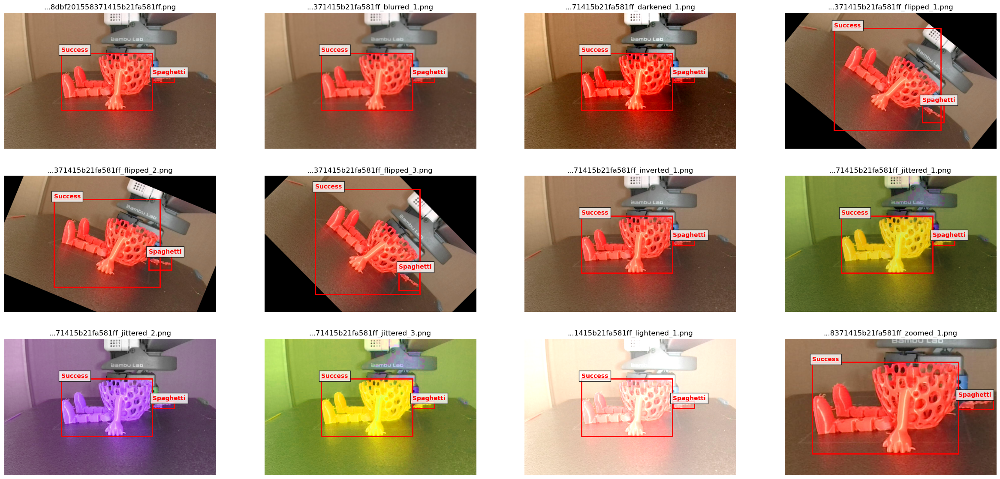

In [81]:
original_image_name = "kfirs_setup_video_2025-01-13_18-05-55_frame_226_jpg.rf.eb27418dbf201558371415b21fa581ff.jpg"

base_name = os.path.splitext(original_image_name)[0]
augmented_images = sorted([img for img in os.listdir(augmented_images_dir)if img.startswith(base_name)])
augmented_labels = sorted([label for label in os.listdir(augmented_labels_dir)if label.startswith(base_name)])

fig, axes = plt.subplots(3, 4, figsize=(30,14))
axes = axes.flatten()

display_images(axes, augmented_images, augmented_labels, annotate=True)

## Image Resizing

YOLO requires input images to be of a specific size (640x640 pixels). Resize all images to this size while maintaining their aspect ratio:

In [84]:
def resize_images_and_labels(image_dir, label_dir, resize_image_dir, resize_label_dir, target_size):
    os.makedirs(resize_image_dir, exist_ok=True)
    os.makedirs(resize_label_dir, exist_ok=True)

    image_files = os.listdir(image_dir)

    for img_file in tqdm(image_files, desc="Resizing Images & Labels", unit="image"):
        img_path = os.path.join(image_dir, img_file)
        label_path = os.path.join(label_dir, os.path.splitext(img_file)[0] + ".txt")

        img = cv2.imread(img_path)
        if img is None:
            continue

        target_w, target_h = target_size
        resized_img = cv2.resize(img, (target_w, target_h), interpolation=cv2.INTER_AREA)
        cv2.imwrite(os.path.join(resize_image_dir, img_file), resized_img)

        resized_labels = []
        with open(label_path, "r") as f:
            for line in f:
                values = list(map(float, line.split()))
                cls, x, y, w, h = values
                resized_labels.append(f"{int(cls)} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

        resized_label_path = os.path.join(resize_label_dir, os.path.splitext(img_file)[0] + ".txt")
        with open(resized_label_path, "w") as f:
            f.writelines(resized_labels)

In [85]:
# Original
initial_resized_dataset_path = os.path.join(initial_dataset_path.parent, "resized_dataset")
# initial_resized_dataset_path = os.path.join(mini_dataset_path.parent, "resized_dataset")
resize_images_dir = os.path.join(initial_resized_dataset_path, images_str)
resize_labels_dir = os.path.join(initial_resized_dataset_path, labels_str)
target_size = (640, 640)
resize_images_and_labels(augmented_images_dir, augmented_labels_dir, resize_images_dir, resize_labels_dir, target_size)

Resizing Images & Labels: 100%|████████| 32208/32208 [26:26<00:00, 20.31image/s]


After resizing the dataset, it's important to verify that the transformations were applied correctly. The following function allows us to visually compare an image before and after resizing, ensuring that both the image and its bounding boxes were adjusted properly.


In [93]:
def show_before_after_resize(original_image_dir, original_label_dir, resized_image_dir, resized_label_dir, image_filename):
    orig_image_path = os.path.join(original_image_dir, image_filename)
    resized_image_path = os.path.join(resized_image_dir, image_filename)
    orig_label_path = os.path.join(original_label_dir, os.path.splitext(image_filename)[0] + ".txt")
    resized_label_path = os.path.join(resized_label_dir, os.path.splitext(image_filename)[0] + ".txt")

    if not os.path.exists(orig_image_path) or not os.path.exists(resized_image_path):
        print(f"Error: Could not load image {image_filename}")
        return

    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    axes[0].imshow(plot_image_with_boxes(orig_image_path, orig_label_path))
    axes[0].set_title("Original Image with Labels")
    axes[0].axis("off")

    axes[1].imshow(plot_image_with_boxes(resized_image_path, resized_label_path))
    axes[1].set_title("Resized Image with Labels")
    axes[1].axis("off")

    plt.show()


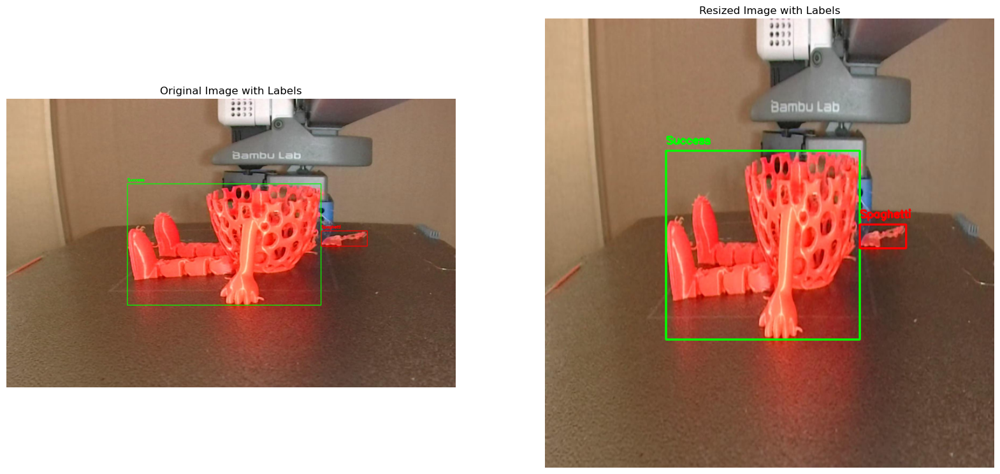

In [97]:
image_filename = "kfirs_setup_video_2025-01-13_18-05-55_frame_226_jpg.rf.eb27418dbf201558371415b21fa581ff.png"
show_before_after_resize(augmented_images_dir, augmented_labels_dir, resize_images_dir, resize_labels_dir, image_filename)

## Data Splitting

To prepare the dataset, it should be divided into three subsets: training (70%), validation (20%), and testing (10%). The training set is used to optimize the model, the validation set monitors performance and adjusts hyperparameters, and the testing set evaluates final results on unseen data. Ensure balanced class distribution across subsets and perform the split before applying augmentations to avoid data leakage and maintain evaluation integrity.

In [101]:
# Original
output_dir = final_dataset_path
# output_dir = os.path.join(mini_dataset_path.parent, "final_dataset")

images_dir = resize_images_dir
labels_dir = resize_labels_dir

def copy_files(file_list, src_dir, dest_dir):
    for file_name in file_list:
        shutil.copy(os.path.join(src_dir, file_name), os.path.join(dest_dir, file_name))

image_files = sorted([f for f in os.listdir(images_dir) if f.endswith(jpg_suffix) or f.endswith(png_suffix)])
label_files = [f.replace(jpg_suffix, txt_suffix).replace(png_suffix, txt_suffix) for f in image_files]

train_imgs, temp_imgs, train_labels, temp_labels = train_test_split(image_files, label_files, test_size=0.3, random_state=42)
valid_imgs, test_imgs, valid_labels, test_labels = train_test_split(temp_imgs, temp_labels, test_size=(1/3), random_state=42)
    
train_images_path = os.path.join(output_dir, train_str, images_str)
train_labels_path = os.path.join(output_dir, train_str, labels_str)
valid_images_path = os.path.join(output_dir, valid_str, images_str)
valid_labels_path = os.path.join(output_dir, valid_str, labels_str)
test_images_path = os.path.join(output_dir, test_str, images_str)
test_labels_path = os.path.join(output_dir, test_str, labels_str)

os.makedirs(train_images_path, exist_ok=True)
os.makedirs(train_labels_path, exist_ok=True)
os.makedirs(valid_images_path, exist_ok=True)
os.makedirs(valid_labels_path, exist_ok=True)
os.makedirs(test_images_path, exist_ok=True)
os.makedirs(test_labels_path, exist_ok=True)

copy_files(train_imgs, images_dir, train_images_path)
copy_files(train_labels, labels_dir, train_labels_path)
copy_files(valid_imgs, images_dir, valid_images_path)
copy_files(valid_labels, labels_dir, valid_labels_path)
copy_files(test_imgs, images_dir, test_images_path)
copy_files(test_labels, labels_dir, test_labels_path)

# EDA - After Augmentation

At this stage, the dataset has undergone several augmentations to enrich its diversity and robustness. Additionally, the data has been organized into a structured format with separate folders for train, valid, and test sets:

This structured arrangement allows for a systematic analysis and evaluation of the data, ensuring its readiness for training.
With the augmentations applied, it is essential to revisit the EDA to assess the impact of these augmentations on the dataset. The focus of this analysis is to:

<u>Verify Dataset Structure:</u> Confirm that the images and labels are correctly organized within the designated directories and that the dataset integrity remains intact after the augmentations.

<u>Analyze Class Distributions:</u> Evaluate the balance of the classes (success and failure) in each subset (train, valid, test) to ensure that the augmented data maintains class proportionality.

<u>Check Image Dimensions:</u> Examine the distribution of image dimensions to ensure consistency, particularly after applying augmentations, and determine if further preprocessing (such as resizing) is required.

This stage is crucial for identifying any issues introduced during augmentations and ensuring that the dataset remains well-prepared for training and evaluation. The insights gained from this post-augmentation EDA will inform the next steps in the model development pipeline.

## Verifying Dataset Integrity


Train Dataset:
Total Images: 22545
Total Labels: 22545
✅ All images have corresponding label files.

Valid Dataset:
Total Images: 6442
Total Labels: 6442
✅ All images have corresponding label files.

Test Dataset:
Total Images: 3221
Total Labels: 3221
✅ All images have corresponding label files.


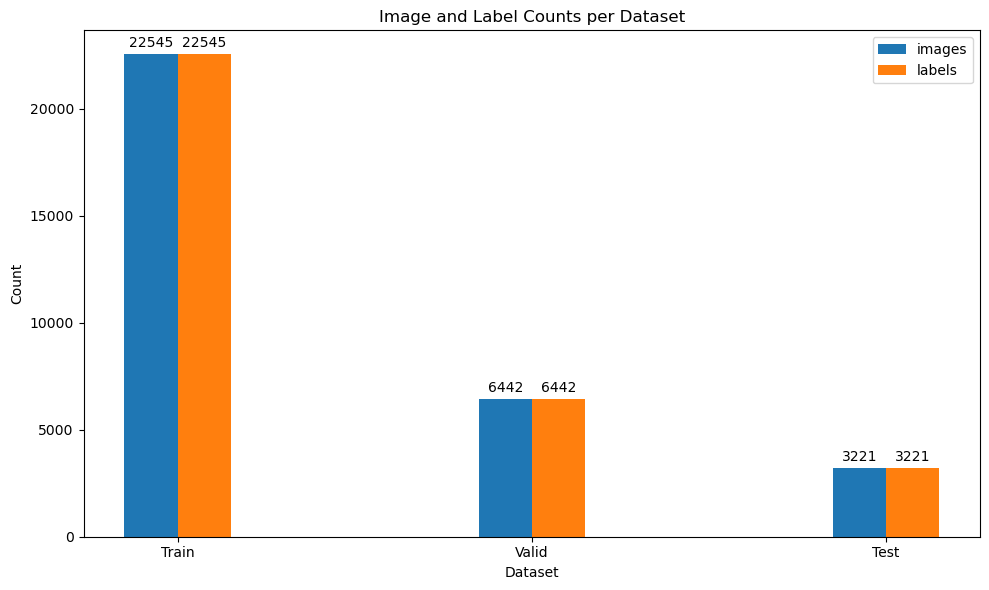

In [107]:
dataset_dirs = {
    train_str: {images_str: train_images_path, labels_str: train_labels_path},
    valid_str: {images_str: valid_images_path, labels_str: valid_labels_path},
    test_str: {images_str: test_images_path, labels_str: test_labels_path}
}
validate_datasets_labels_vs_images(dataset_dirs)

The dataset has been successfully divided into train, valid, and test subsets, with each subset containing a balanced number of images and corresponding label files. The bar chart confirms that all images across the subsets have matching annotations, ensuring the dataset's integrity.

## Class Distribution Analysis


Train Class Distribution:
Success: 11199
Spaghetti: 11346
✅ Success and Spaghetti are balanced.
Imbalance: 147 (0.65%)

Valid Class Distribution:
Success: 3203
Spaghetti: 3239
✅ Success and Spaghetti are balanced.
Imbalance: 36 (0.56%)

Test Class Distribution:
Success: 1558
Spaghetti: 1663
✅ Success and Spaghetti are balanced.
Imbalance: 105 (3.26%)


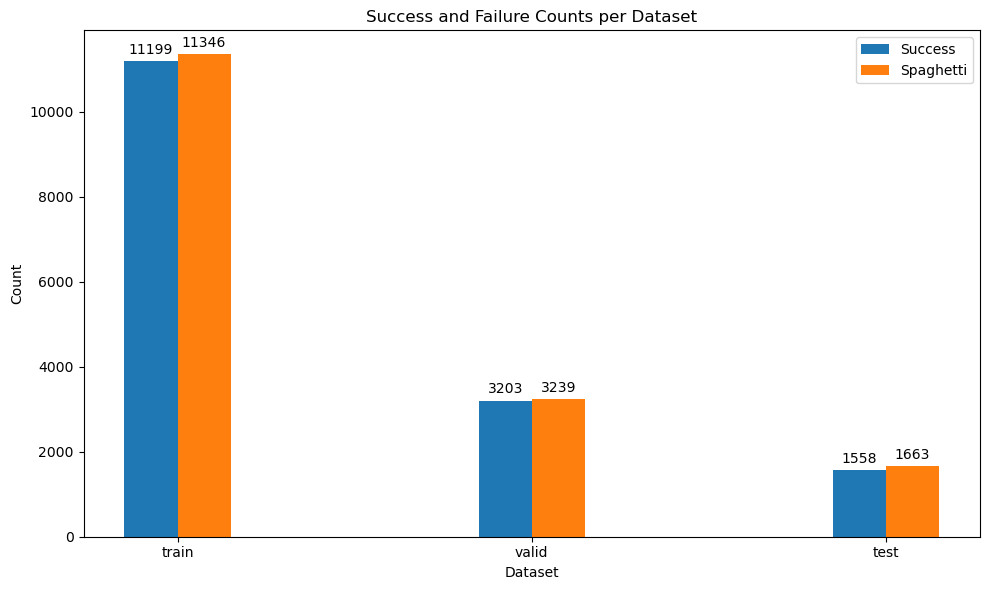

In [111]:
analyze_class_distribution(dataset_dirs)

Following the augmentation and preprocessing steps, the second EDA confirms that the dataset is now well-structured and balanced across the training, validation, and test sets. The initial imbalance between successful prints and spaghetti failures has been effectively addressed, ensuring that both classes are evenly represented. The controlled augmentation strategy, which applied fewer augmentations to successful prints, proved to be a successful approach in maintaining this balance.

With a minimal class imbalance across all subsets, the dataset is now in optimal condition for training. This balance will help the model generalize better and avoid biases toward either class.

## Balance Between Custom and Internet Data Analysis


Analyzing Train Dataset:
Total Labels: 22545
kfirs_setup_ Labels: 11377 (50.46%)
Other Labels: 11168 (49.54%)
✅ Success and Spaghetti are balanced.
Imbalance: 209 (0.93%)

Analyzing Valid Dataset:
Total Labels: 6442
kfirs_setup_ Labels: 3225 (50.06%)
Other Labels: 3217 (49.94%)
✅ Success and Spaghetti are balanced.
Imbalance: 8 (0.12%)

Analyzing Test Dataset:
Total Labels: 3221
kfirs_setup_ Labels: 1618 (50.23%)
Other Labels: 1603 (49.77%)
✅ Success and Spaghetti are balanced.
Imbalance: 15 (0.47%)


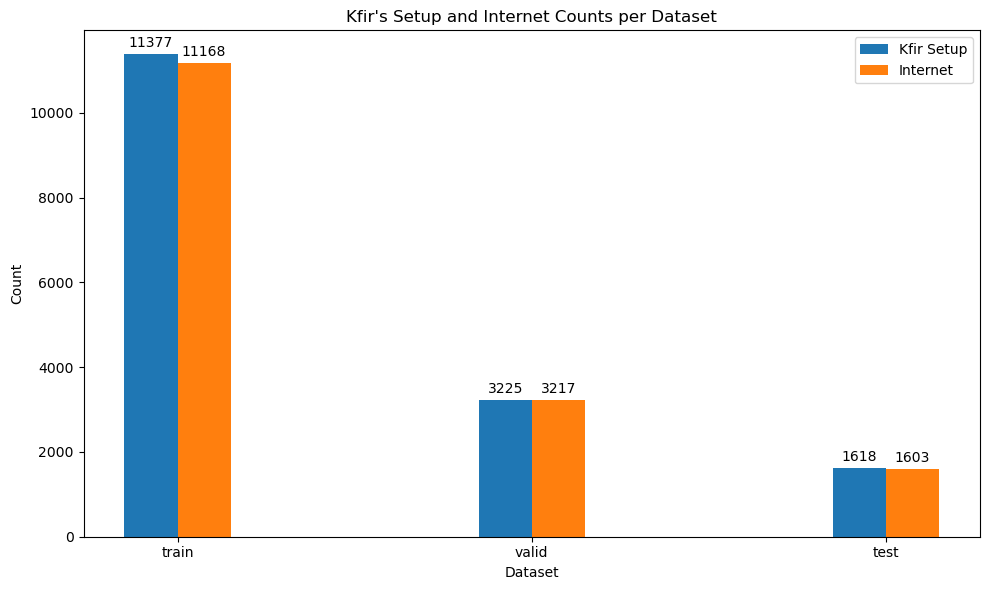

In [115]:
compare_kfir_to_internet_data(dataset_dirs)

The dataset maintains an excellent balance between custom-collected (Kfir Setup) and internet-sourced data across all subsets. The minor variations in distribution are well within acceptable limits, ensuring that the model is exposed to diverse data sources without developing bias. This balanced representation enhances the model’s ability to generalize effectively to real-world conditions, making it more robust in detecting spaghetti failures across different printing environments.

## Summary of the Second EDA

Following data augmentation and preprocessing, the second EDA confirmed that the dataset is now well-structured, balanced, and optimized for model training. The class distribution analysis shows that successful prints and spaghetti failures are nearly equal across the train, validation, and test sets, mitigating concerns of model bias. This balance was achieved by applying targeted augmentations, particularly focusing on failure cases while minimizing excessive transformations on successful prints.

Furthermore, the dataset maintains a strong equilibrium between custom-collected (Kfir Setup) and internet-sourced data, ensuring diversity without over-representing any particular source. This balance is critical for enhancing the model’s generalization capabilities, making it more effective in real-world applications. Finally, while image dimensions remain somewhat varied, the preprocessing steps—especially resizing—have standardized the input format, ensuring compatibility with the YOLO model. With a well-prepared dataset in place, the next phase focuses on training the detection model to classify and identify spaghetti failures accurately.

# Model Training

Training a deep learning model for object detection involves several essential steps, including model selection, training, validation, and evaluation. The primary goal is to develop a system that can accurately classify and detect failures in 3D prints, distinguishing between successful prints and spaghetti failures. This process requires feeding labeled images into the model, optimizing its parameters through backpropagation, and continuously refining its accuracy through validation and testing.

For this project, I utilize YOLO (You Only Look Once), a cutting-edge object detection algorithm known for its speed and accuracy. Unlike traditional object detection models that apply multiple passes to analyze different regions of an image, YOLO processes the entire image in a single forward pass, making it highly efficient for real-time applications. YOLO works by dividing an image into a grid and predicting bounding boxes and class probabilities simultaneously, allowing it to detect objects quickly and effectively.

YOLOv11 provides multiple pre-trained weight files (.pt), each optimized for different needs. Smaller models like YOLOv11n (Nano) prioritize speed and efficiency, making them suitable for low-power devices, while larger models like YOLOv11x (Extra Large) offer higher accuracy but require more computational resources. Given the importance of detecting subtle differences in 3D prints, a mid-sized model such as YOLOv11m (Medium) or YOLOv11l (Large) is likely the best choice. These models provide a balanced trade-off between detection accuracy and processing efficiency, ensuring reliable performance without excessive computational demands.

By carefully selecting the right YOLOv11 model and fine-tuning it on my dataset, the objective is to create a robust detection system capable of accurately identifying print failures. This trained model will improve the reliability and efficiency of 3D printing by enabling early detection of issues, reducing material waste, and minimizing downtime.

## Training Process

Before training the YOLOv11 model, it is essential to define a dataset configuration file in YAML format. This file provides the necessary information about the dataset, including the paths to the training, validation, and test images, the number of classes, and the class names. The YAML file ensures that YOLO can correctly map image data to the corresponding labels and structure the training process accordingly.

The model training process involves several key steps. First, the model initializes using a pre-trained weight file (such as YOLOv11m.pt), which serves as a starting point with learned features from a general dataset. Using transfer learning, the model then adapts these features to the specific task of detecting spaghetti failures in 3D prints. The training phase optimizes the model over multiple epochs, adjusting its weights based on the dataset. Parameters such as batch size, image size, and learning rate impact the model's ability to generalize and detect failures accurately.

During training, the model iterates over the dataset, evaluating its predictions against the ground truth labels and adjusting its parameters to minimize error. A validation set monitors performance to prevent overfitting, ensuring that the model generalizes well beyond the training data. Once training is complete, the best-performing model is saved, ready for evaluation and use.

In [137]:
def train_model():
    model = YOLO('yolo11m.pt')
    results = model.train(
        data="Final/MiniDataset/data.yaml",
        epochs=70,
        batch=32,
        imgsz=640,
        name='yolo_spaghetti_detector_v1',
        device=0
    )
    model.export(format="torchscript")
    print(f"Model training complete. Best model saved as best_model_spaghetti.pt")

# Due to hardware limitations, the model was not run on a local machine but instead deployed on a virtual machine using Amazon EC2 on AWS.
# train_model()

## Model Analysis

The performance of the YOLOv11 model was evaluated based on multiple key metrics, including loss reduction, precision, recall, and mean Average Precision (mAP). These indicators provide insight into the effectiveness of the model in detecting spaghetti failures in 3D prints.

During the training process, the model's losses—box loss, classification loss, and distribution focal loss (DFL)—showed a consistent downward trend. This indicates that the model successfully learned meaningful features and adjusted its weights accordingly. The validation losses followed a similar decreasing pattern, suggesting that the model did not overfit the training data and generalizes well to unseen samples. By the final epoch, the losses reached a train box loss of 0.2456, a train classification loss of 0.1557, and a train DFL loss of 0.8816, while the validation losses were 0.3141 for box loss, 0.2032 for classification loss, and 0.9278 for DFL loss. These results confirm that the model effectively minimized errors during training while maintaining stability in validation.

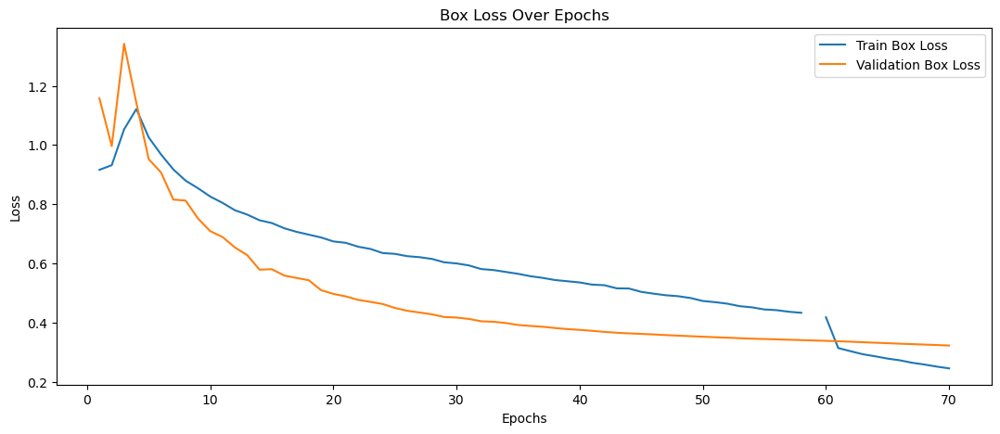

In [162]:
results_df = pd.read_csv("Model/detect/yolo_spaghetti_detector_v1/results.csv")
plt.figure(figsize=(13,5))
plt.plot(results_df['epoch'], results_df['train/box_loss'], label='Train Box Loss')
plt.plot(results_df['epoch'], results_df['val/box_loss'], label='Validation Box Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Box Loss Over Epochs')
plt.legend()
plt.show()

The model's object detection performance was assessed using precision, recall, and mean Average Precision (mAP) at different IoU thresholds. Precision measures the proportion of correctly identified failures out of all detected failures, while recall measures the proportion of correctly identified failures out of all actual failures. The metrics mAP50 and mAP50-95 represent the model’s accuracy at different IoU thresholds, where higher values indicate better performance. The final results achieved were a precision of 0.98, a recall of 0.969, an mAP50 of 0.992, and an mAP50-95 of 0.95. These high values suggest that the model is highly effective at identifying 3D print failures with minimal false positives and false negatives.

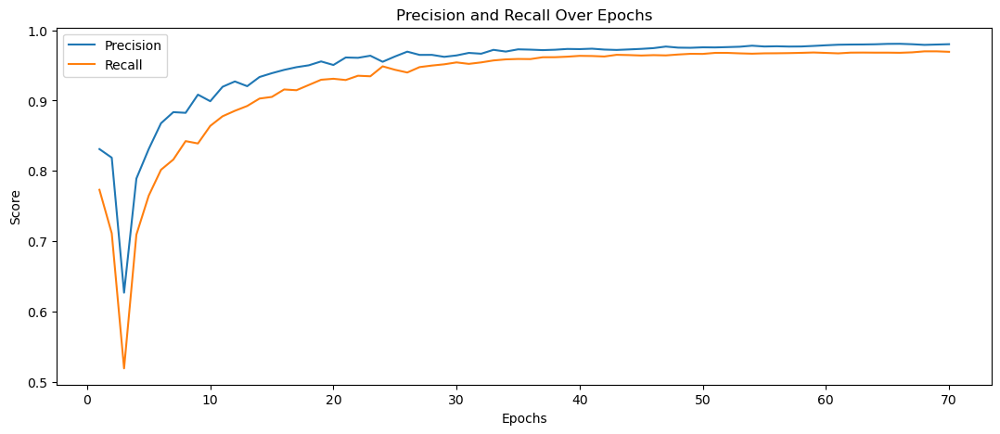

In [168]:
plt.figure(figsize=(13,5))
plt.plot(results_df['epoch'], results_df['metrics/precision(B)'], label='Precision')
plt.plot(results_df['epoch'], results_df['metrics/recall(B)'], label='Recall')
plt.xlabel('Epochs')
plt.ylabel('Score')
plt.title('Precision and Recall Over Epochs')
plt.legend()
plt.show()

The strong performance of the model can likely be attributed to several factors. First, the use of transfer learning with pre-trained YOLOv11 weights provided a strong initial feature extraction capability, enabling the model to quickly adapt to the specific task of detecting spaghetti failures. Second, the choice of an appropriate dataset with a sufficient number of diverse samples ensured that the model learned to recognize failures under different conditions. Additionally, the training process incorporated hyperparameter tuning, such as selecting an optimal learning rate and batch size, which contributed to stable convergence. Lastly, data augmentation techniques helped improve generalization by exposing the model to variations in lighting, orientation, and background, making it more robust in real-world scenarios.

Overall, the YOLOv11 model demonstrated strong performance in detecting 3D print failures, achieving a high mAP and balanced precision-recall scores. The training process showed consistent convergence, and the validation losses confirmed generalization. Future work could focus on fine-tuning hyperparameters and deploying the model in practical settings to further optimize reliability and efficiency in automated failure detection.

<center>
    <img src="https://i.imgur.com/JEvU3Ae.png" width="1000" height="150"/>
</center>

## Evaluating Model Performance on Unseen Data

To evaluate the model's generalization capabilities, it is essential to test its performance on unseen data by using a dedicated test folder. This folder contains images that were not part of the training or validation sets, ensuring that the model's accuracy is assessed in real-world conditions. By running inference on these unseen images, we can measure how well the model detects spaghetti failures in diverse and previously unencountered scenarios. This step is crucial because a model that performs well on training data but poorly on new data may suffer from overfitting, meaning it has memorized patterns rather than learned generalizable features. Testing on new images helps validate the model’s robustness, ensuring that it remains effective in practical applications and does not rely on dataset-specific characteristics.

In [230]:
def display_predictions(axes, images, model):
    for ax, img_file in zip(axes, images):
        img_path = os.path.join(test_images_path, img_file)

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        results = model.predict(img, save=False)[0]

        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"...{img_file[-30:]}", fontsize=12)

        for box in results.boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            class_id = int(box.cls[0])
            label = f"{model.names[class_id]} {box.conf[0]:.2f}"

            color = "red" if model.names[class_id].lower() == "failure" else "green"

            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor=color, facecolor="none")
            ax.add_patch(rect)
            ax.text(x1, y1 - 10, label, color=color, fontsize=14, weight="bold",
                    bbox=dict(facecolor="white", alpha=0.8))



0: 640x640 1 success, 785.8ms
Speed: 3.1ms preprocess, 785.8ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 successs, 715.4ms
Speed: 4.2ms preprocess, 715.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 success, 737.1ms
Speed: 6.5ms preprocess, 737.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 success, 717.7ms
Speed: 3.8ms preprocess, 717.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 failure, 695.5ms
Speed: 3.5ms preprocess, 695.5ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 success, 763.0ms
Speed: 3.5ms preprocess, 763.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 failure, 689.5ms
Speed: 3.9ms preprocess, 689.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 successs, 670.4ms
Speed: 4.2ms preprocess, 670.4ms inference, 0.9ms postprocess pe

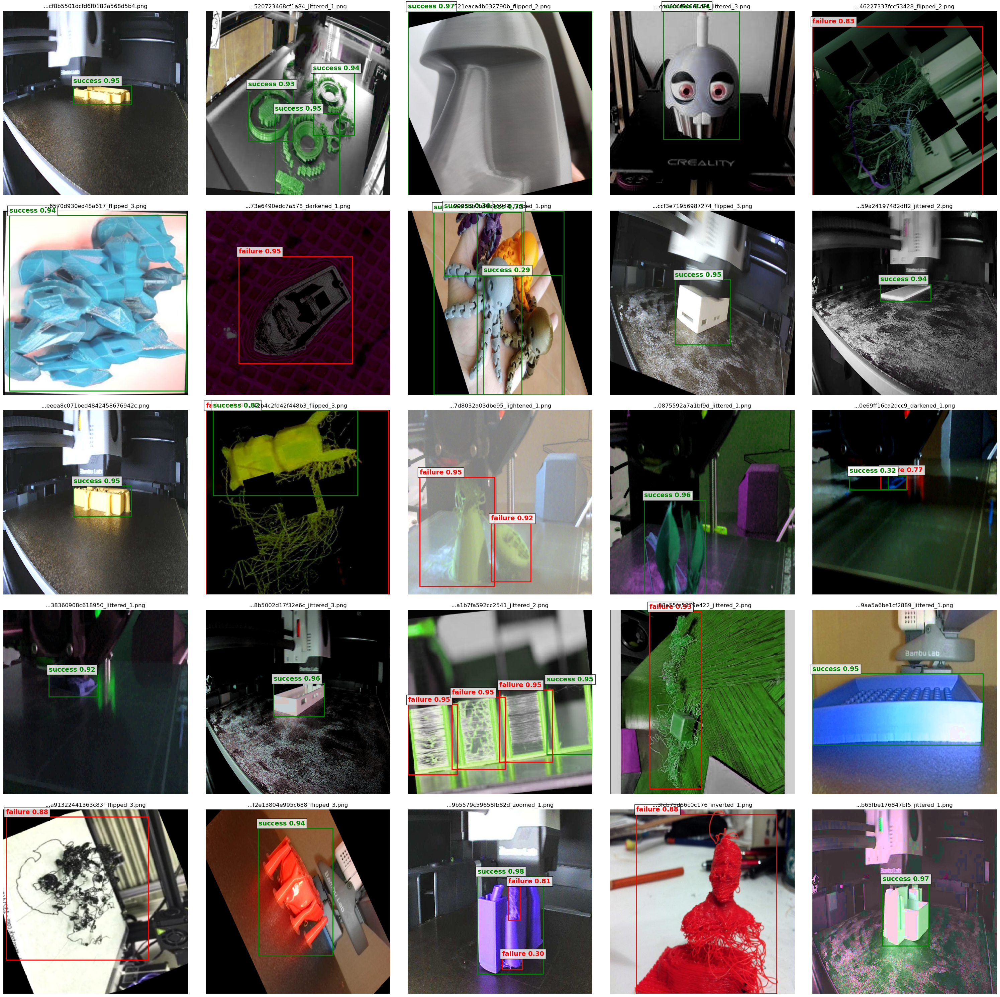

In [247]:
model = YOLO('Model/detect/yolo_spaghetti_detector_v1/weights/best.pt')

image_files = [f for f in os.listdir(test_images_path) if f.endswith((jpg_suffix, png_suffix))]

kfirs_images = [img for img in image_files if img.startswith(kfir_setup_prefix)]
other_images = [img for img in image_files if not img.startswith(kfir_setup_prefix)]
selected_images = random.sample(kfirs_images, min(13, len(kfirs_images))) + random.sample(other_images, min(12, len(other_images)))
random.shuffle(selected_images)

fig, axes = plt.subplots(5, 5, figsize=(30, 30))
axes = axes.flatten()
display_predictions(axes, selected_images, model)

plt.tight_layout()
plt.show()


Based on our results, we can see that the model performs exceptionally well, even in complex cases and challenging conditions. It successfully detects both successful prints and failures, maintaining high accuracy across a wide range of scenarios. This plot shows how the model handles varied lighting conditions, different viewing angles, and even partially obscured objects, demonstrating its robustness and reliability.

Moreover, the model effectively identifies edge cases, such as prints with partial deformations, irregular spaghetti failures, and prints in unusual orientations or colors. The detection boxes and confidence scores indicate that the model can distinguish between critical failures and minor deviations, providing confidence levels that align well with the actual results.

Our results clearly indicate that the model is highly suitable for use in automated 3D print monitoring systems, with significant potential to reduce material waste and improve print success rates.

## Using the model in real time

Now that we have tested the model, it's time for the real challenge. We will analyze a video recorded from a camera positioned close to the 3D printer during the printing process and evaluate the model's detection capabilities:

<center>
    <video src="https://i.imgur.com/w16RqD8.mp4" width="800" height="500" controls>
</center>

# Conclusion

This project aimed to develop a machine learning-based system for detecting failures in 3D printing, leveraging the YOLOv11 model for real-time classification of successful and failed prints. From the initial stages of data collection to final model evaluation, the process presented several challenges that required iterative improvements. The creation of a diverse and well-annotated dataset proved to be one of the most time-consuming tasks, as it was crucial to ensure proper representation of different failure types under various lighting conditions and angles. Early issues such as class imbalance led to biased predictions, requiring adjustments to the dataset and augmentation techniques to improve generalization.

Training the model introduced additional complexities, particularly in selecting the right balance between model size, computational efficiency, and accuracy. Initial experiments with smaller models struggled with complex geometries, while larger models demanded significant computational resources. Transfer learning from pre-trained YOLO weights helped accelerate convergence, but fine-tuning hyperparameters such as batch size and augmentation strategies required extensive experimentation. Overfitting became a concern, with some models performing well on training data but struggling to generalize to new prints, highlighting the need for careful validation and continuous refinement.

Testing the model on unseen data demonstrated its strong generalization capabilities, successfully detecting failures in a variety of conditions, including complex geometries, challenging lighting, and partially completed prints. The model consistently achieved high precision and recall, accurately distinguishing between successful prints and failures, even in cases where defects were subtle or irregular. Its ability to correctly classify edge cases, such as spaghetti failures with unusual structures or prints with reflective surfaces, highlights its robustness. Additionally, optimizing the inference pipeline ensured real-time performance without compromising accuracy, making the model well-suited for deployment in automated print monitoring systems.


The final model successfully detects failures across a wide range of conditions, demonstrating the feasibility of deep learning for quality assurance in 3D printing. By integrating structured training, validation, and testing workflows, we developed a system capable of reducing material waste and improving printing success rates. Future work could focus on expanding the dataset, enhancing model robustness for rare failure types, and integrating real-time corrective mechanisms into 3D printing workflows. This project highlights the potential of AI-driven automation in manufacturing, showcasing how deep learning can optimize processes and improve efficiency in additive manufacturing environments.